In [2]:
%run -n main.py
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

/Users/alexkuk/envs/mypy3/lib/python3.5/site-packages/odo/backends/pandas.py:94: FutureWarning: pandas.tslib is deprecated and will be removed in a future version.
You can access NaTType as type(pandas.NaT)
  @convert.register((pd.Timestamp, pd.Timedelta), (pd.tslib.NaTType, type(None)))


In [3]:
jobs = jobs_manager()
bk.output_notebook()

Loading BokehJS ...

# Data

In [3]:
# %run -n main.py
# paths = [RAW_CITYMOBIL1, RAW_CITYMOBIL2, RAW_CITYMOBIL3]
# chunks = chain.from_iterable(read_chunks(_, 1024 * 1024) for _ in paths)
# # chunks = islice(chunks, 5)
# records = parse_citymobil_sql(chunks)
# records = log_progress(records, total=130000000)
# lines = map_citymobil_sql(records)
# dump_lines(lines, MAP_CITYMOBIL_SQL)

In [4]:
# sort_table(MAP_CITYMOBIL_SQL, by=(0, 1, 2, 3))

In [5]:
# %run -n main.py
# records = log_progress(read_map_citymobil_sql(), total=130000000)
# lines = format_citymobil_sql_groups(records)
# dump_lines(lines, CITYMOBIL)

In [6]:
# %run -n main.py
# records = load_citymobil()
# # records = islice(records, 100000)
# records = log_progress(records, total=2000000)
# lines = format_track_points(records)
# dump_lines(lines, TRACK_POINTS)

In [129]:
# %run -n main.py
# records = load_citymobil()
# # records = islice(records, 100000)
# records = log_progress(records, total=2000000)
# orders = compute_order_features(records)
# lines = format_order_features(orders)
# dump_lines(lines, ORDERS_FEATURES)

164482/|/  8%|| 164482/2000000 [01:20<14:53, 2053.97it/s]

# Orders

In [3]:
records = load_order_features()
records = log_progress(records, total=2000000)
orders = list(records)

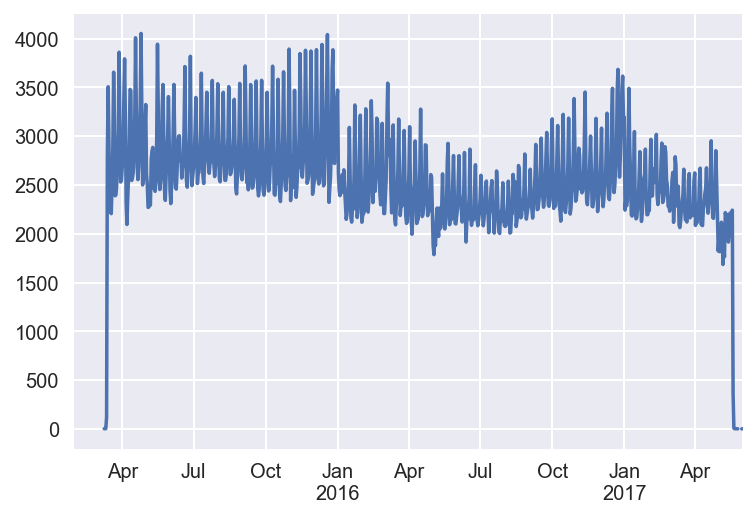

In [102]:
%run -n main.py
show_orders_by_time(log_progress(orders))

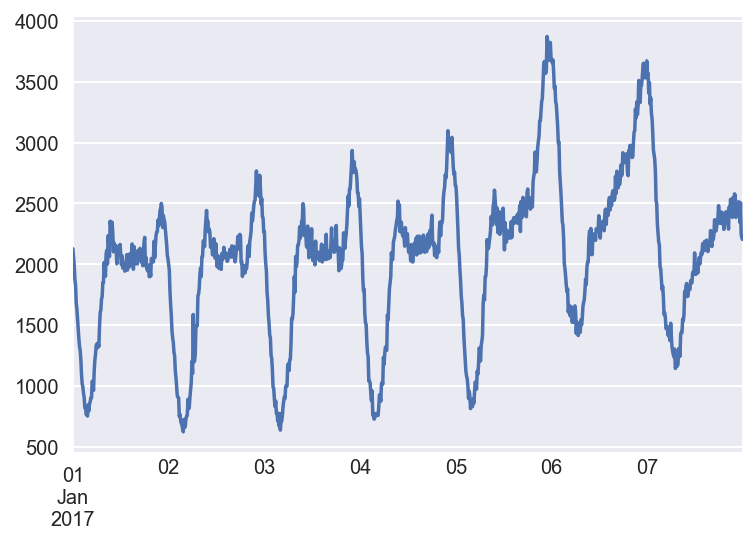

In [571]:
show_orders_by_week(log_progress(orders))

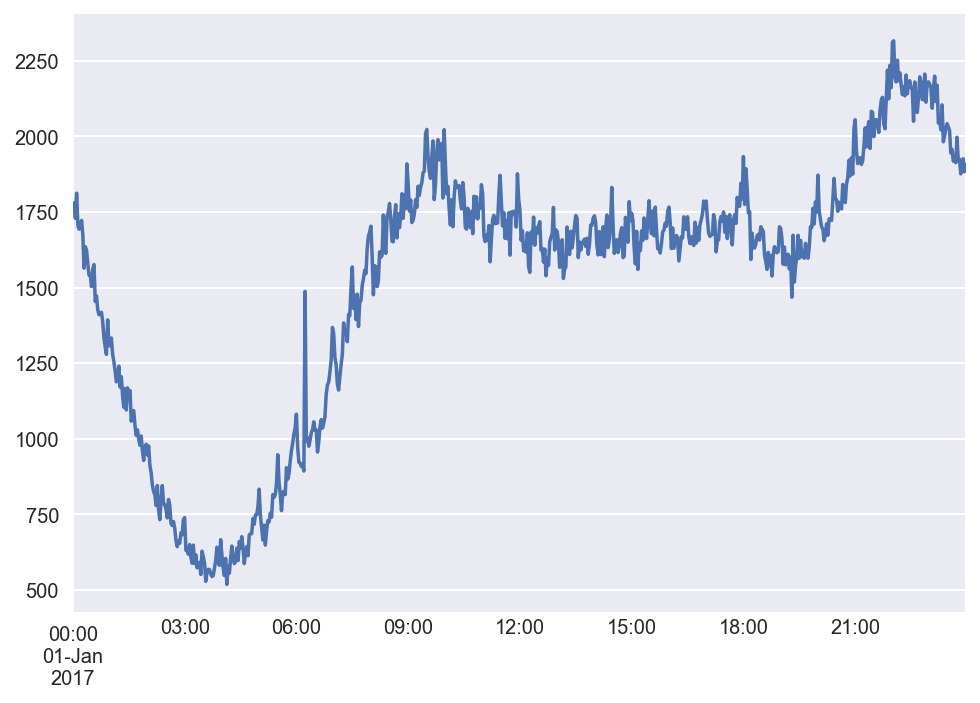

In [62]:
show_orders_by_weekday(log_progress(orders))

In [99]:
%run -n main.py
table = convert_order_features_table(make_order_features_table(orders))
table['hour'] = table.timestamp.dt.hour.astype('category')
table['day_of_week'] = table.timestamp.dt.dayofweek.astype('category')
table['minute'] = table.timestamp.dt.minute

In [197]:
%run -n main.py
def draw_pickups(canvas, data):
    aggregate = canvas.points(data, 'pickup_longitude', 'pickup_latitude', ds.count())
    # aggregate = convolve_aggregate(aggregate)
    return tf.shade(aggregate, alpha=200, cmap=viridis, how='eq_hist')


map = get_map(MOSCOW_BOX, DARK_CARTO)
overlay_image(map, draw_pickups, data=table)

In [198]:
def draw_dropoffs(canvas, data):
    aggregate = canvas.points(data, 'dropoff_longitude', 'dropoff_latitude', ds.count())
    # aggregate = convolve_aggregate(aggregate)
    return tf.shade(aggregate, cmap=inferno, how='eq_hist')


map = get_map(MOSCOW_BOX, DARK_CARTO)
overlay_image(map, draw_dropoffs, data=table)

In [199]:
%run -n main.py
def draw_dropoffs_vs_pickups(canvas, data):
    pickups = canvas.points(data, 'pickup_longitude',  'pickup_latitude',  ds.count())
    pickups = convolve_aggregate(pickups)
    dropoffs = canvas.points(data, 'dropoff_longitude', 'dropoff_latitude', ds.count())
    dropoffs = convolve_aggregate(dropoffs)
    more_pickups = tf.shade(pickups.where(pickups > dropoffs), cmap=viridis, how='log')
    more_dropoffs = tf.shade(dropoffs.where(dropoffs > pickups), cmap=inferno,  how='log')
    return tf.stack(more_pickups, more_dropoffs)


map = get_map(MOSCOW_BOX, DARK_CARTO)
overlay_image(map, draw_dropoffs_vs_pickups, data=table)

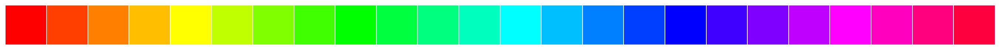

In [172]:
sns.palplot(COLORS24)

In [173]:
def draw_pickup_hours(canvas, data):
    aggregate = canvas.points(data, 'pickup_longitude', 'pickup_latitude', ds.count_cat('hour'))
    aggregate = convolve_aggregate(aggregate, KERNEL_3D)
    return tf.shade(aggregate, color_key=COLORS24)


map = get_map(MOSCOW_BOX, DARK_CARTO)
overlay_image(map, draw_pickup_hours, data=table)

In [200]:
def draw_dropoff_hours(canvas, data):
    aggregate = canvas.points(data, 'dropoff_longitude', 'dropoff_latitude', ds.count_cat('hour'))
    aggregate = convolve_aggregate(aggregate, KERNEL_3D)
    return tf.shade(aggregate, color_key=COLORS24)


map = get_map(MOSCOW_BOX, DARK_CARTO)
overlay_image(map, draw_dropoff_hours, data=table)

# Animation

In [167]:
%run -n main.py
records = make_animation_frames(table)
records = cache_frames(records)
records = log_progress(records)
frames = list(records)

In [161]:
%run -n main.py    
build_animation(log_progress(frames))

# Tracks

In [4]:
%%time
tracks = convert_track_points(load_track_points())
tracks['hour'] = tracks.timestamp.dt.hour.astype('category')

CPU times: user 2min 36s, sys: 1min 11s, total: 3min 48s
Wall time: 5min 5s


In [217]:
len(tracks)

129999948

In [7]:
%run -n main.py
def draw(canvas, data):
    aggregate = canvas.points(data, 'longitude', 'latitude', ds.count())
    aggregate = convolve_aggregate(aggregate)
    return tf.shade(aggregate, cmap=inferno, how='eq_hist')


map = get_map(MOSCOW_BOX, DARK_CARTO)
overlay_image(map, draw, data=tracks)

# Viz

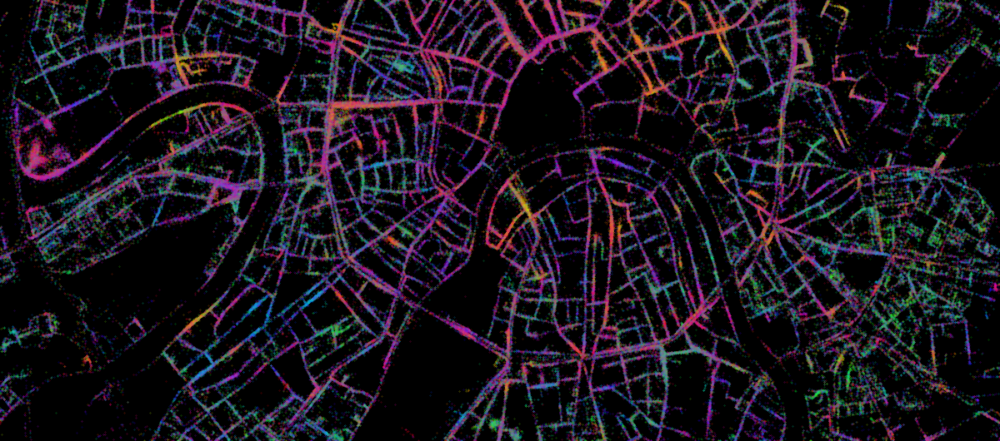

In [201]:
box = BoundingBox(
    Point(55.722194, 37.530442),
    Point(55.762091, 37.690774)
)
canvas = get_canvas(box, 1200)
aggregate = canvas.points(table, 'pickup_longitude', 'pickup_latitude', ds.count_cat('hour'))
aggregate = convolve_aggregate(aggregate, KERNEL_3D)
image = tf.shade(aggregate, color_key=COLORS24)
tf.set_background(image, BLACK)

In [ ]:
%run -n main.py
canvas = get_canvas(MOSCOW_BOX3, width=1500)
aggregate = canvas.points(tracks, 'longitude', 'latitude', ds.count())
image = tf.shade(aggregate, cmap=inferno, how='eq_hist')
tf.set_background(image, BLACK)

In [ ]:
week_counts = Counter()
for record in log_progress(orders):
    timestamp = datetime.fromtimestamp(record.timestamp)
    key = (timestamp.weekday() + 1, timestamp.hour)
    week_counts[key] += 1

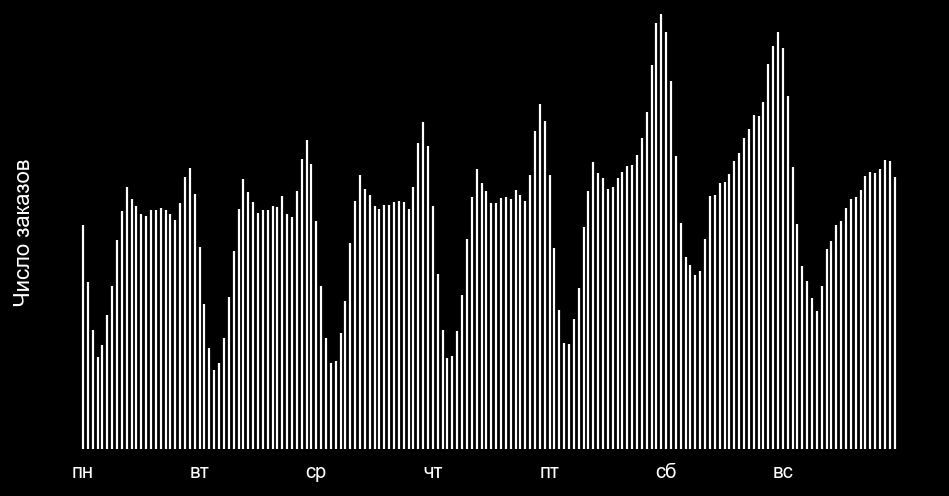

In [202]:
fig, ax = plt.subplots()
fig.set_size_inches([8, 4])
fig.patch.set_facecolor('black')
ax.patch.set_facecolor('black')
x = range(len(week_counts))
ymin = [0 for _ in x]
ymax = [week_counts[_] for _ in sorted(week_counts)]
ax.vlines(x, ymin, ymax, linewidth=1.1, color='white')
ax.set_ylim([0, max(ymax)])
ax.set_ylabel('Число заказов')
ax.get_yaxis().set_ticks([])
ax.yaxis.label.set_color('white')
ax.set_xticks(x[::24])
ax.set_xticklabels(['пн', 'вт', 'ср', 'чт', 'пт', 'сб', 'вс'])
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.grid(None)

In [ ]:
day_counts = Counter()
for record in log_progress(orders):
    timestamp = datetime.fromtimestamp(record.timestamp)
    day_counts[timestamp.hour] += 1

In [ ]:
GIBDD = os.path.join(DATA_DIR, 'gibdd.tsv')

gibdd = pd.read_csv(GIBDD, sep='\t')

In [ ]:
gibdd['timestamp'] = pd.to_datetime(gibdd.timestamp)

In [ ]:
gibdd_counts = Counter()
for record in gibdd.itertuples():
    timestamp = record.timestamp
    gibdd_counts[timestamp.hour, timestamp.minute // 30] += 1

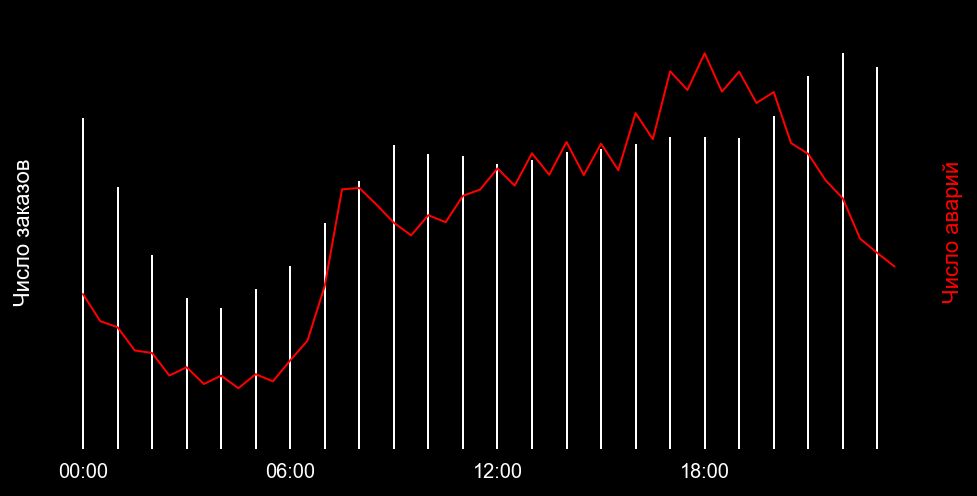

In [203]:
fig, ax = plt.subplots()
fig.set_size_inches([8, 4])
fig.patch.set_facecolor('black')
ax.patch.set_facecolor('black')

x = range(len(gibdd_counts))
maximum = max(gibdd_counts.values())
y = [gibdd_counts[_] / maximum  for _ in sorted(gibdd_counts)]
ax.plot(x, y, color='red', lw=1)

x = x[::2]
ymin = [0 for _ in x]
maximum = max(day_counts.values())
ymax = [day_counts[_] / maximum for _ in sorted(day_counts)]
ax.vlines(x, ymin, ymax, linewidth=1, color='white')
ax.set_ylim([0, 1.1])

ax.set_ylabel('Число заказов')
ax.get_yaxis().set_ticks([])
ax.yaxis.label.set_color('white')
ax.set_xticks(x[::6])
ax.set_xticklabels(['00:00', '06:00', '12:00', '18:00'])
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.grid(None)

ax2 = ax.twinx()
ax2.set_ylabel('Число аварий')
ax2.get_yaxis().set_ticks([])
ax2.yaxis.label.set_color('red')

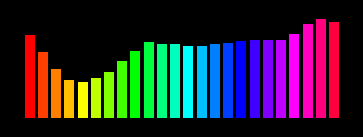

In [204]:
fig, ax = plt.subplots()
fig.set_size_inches([3, 1])
fig.patch.set_facecolor('black')
ax.patch.set_facecolor('black')

x = range(len(day_counts))
ymin = [0 for _ in x]
ymax = [day_counts[_] for _ in sorted(day_counts)]
ax.vlines(x, ymin, ymax, linewidth=5, color=COLORS24)

ax.set_yticks([])
ax.set_xticks([])
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.grid(None)